In [120]:
import matplotlib.pyplot as plt
import numpy as np
import scipy as sp
import networkx as nx
import pickle

In [122]:
with open('output/nodes.pickle', 'rb') as f:
    nodes_list = pickle.load(f)

with open('output/edges.pickle', 'rb') as f:
    edges_list = pickle.load(f)

print('nodes:', len(nodes_list), ', edges (doubled):', len(edges_list))

nodes: 1060 , edges (doubled): 49760


In [123]:
G = nx.Graph(name='DDNet_Teamranks')
G.add_nodes_from(nodes_list)
G.add_weighted_edges_from(edges_list)
print(G.number_of_edges(), G.number_of_nodes(), G.name)


24880 1060 DDNet_Teamranks


In [124]:
wts = [x[1]['weight'] for x in G.nodes.data()]
n_labels = nx.get_node_attributes(G, 'labels')
n = G.number_of_nodes()

k_custom = 3 / (n ** 0.5)
n_size = [(1500 * x) for x in wts]

D:\PycharmProjects\DDNet_Social_graph\venv\lib\site-packages\matplotlib\backends\backend_agg.py:240: RuntimeWarning: Glyph 146 missing from current font.
  font.set_text(s, 0.0, flags=flags)
D:\PycharmProjects\DDNet_Social_graph\venv\lib\site-packages\matplotlib\backends\backend_agg.py:240: RuntimeWarning: Glyph 150 missing from current font.
  font.set_text(s, 0.0, flags=flags)
D:\PycharmProjects\DDNet_Social_graph\venv\lib\site-packages\matplotlib\backends\backend_agg.py:203: RuntimeWarning: Glyph 146 missing from current font.
  font.set_text(s, 0, flags=flags)
D:\PycharmProjects\DDNet_Social_graph\venv\lib\site-packages\matplotlib\backends\backend_agg.py:203: RuntimeWarning: Glyph 150 missing from current font.
  font.set_text(s, 0, flags=flags)
D:\PycharmProjects\DDNet_Social_graph\venv\lib\site-packages\matplotlib\backends\backend_agg.py:240: RuntimeWarning: Glyph 158 missing from current font.
  font.set_text(s, 0.0, flags=flags)
D:\PycharmProjects\DDNet_Social_graph\venv\lib\si

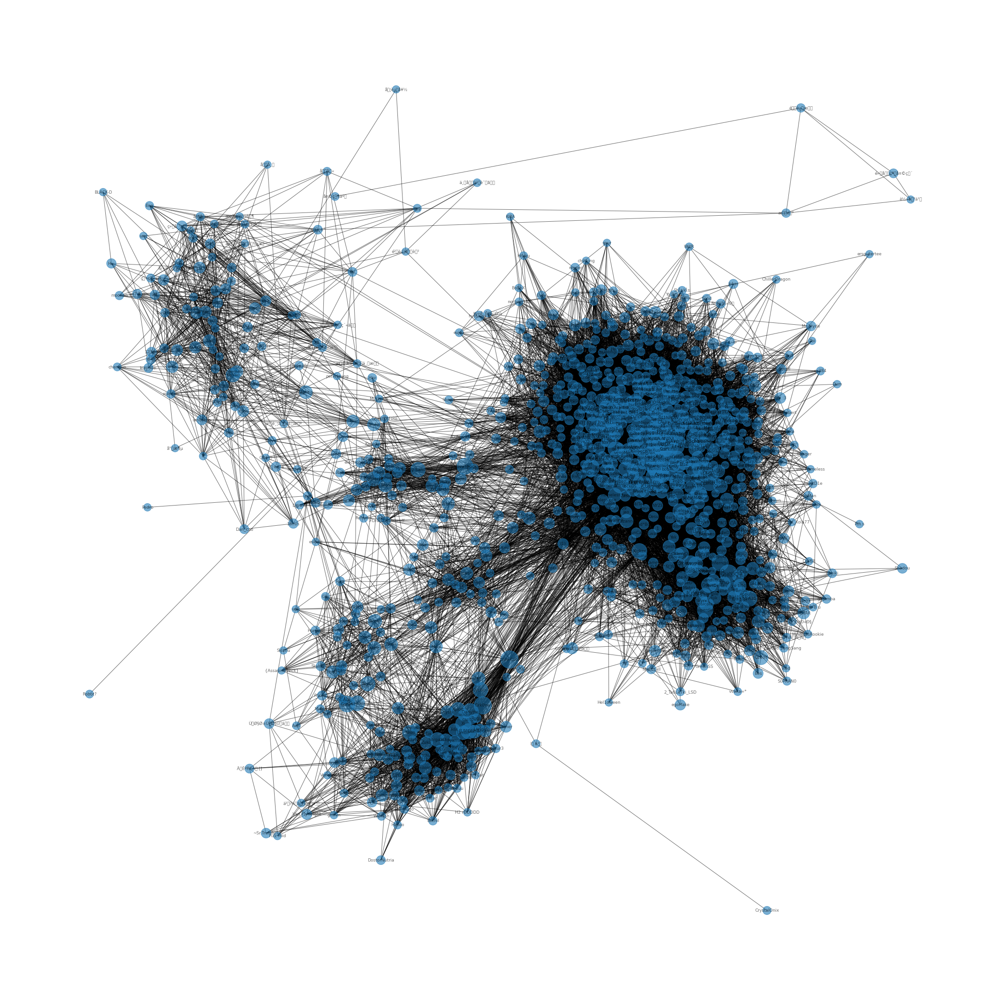

In [125]:
plt.figure(figsize = (30, 30))
nx.draw(G, pos=nx.drawing.layout.spring_layout(G, k=k_custom),
        node_size=n_size, labels=n_labels, font_size=9, alpha=0.6,
        with_labels=True)
plt.savefig('output_plots/G.png')

__________

In [126]:
with open('output/nodes_short.pickle', 'rb') as f:
    nodes_list_short = pickle.load(f)
with open('output/edges_short.pickle', 'rb') as f:
    edges_list_short = pickle.load(f)

print('nodes:', len(nodes_list_short), ', edges (x2):', len(edges_list_short))

nodes: 296 , edges (x2): 10728


In [127]:
g = nx.Graph(name='DDNet_Teamranks_short')
g.add_nodes_from(nodes_list_short)
g.add_weighted_edges_from(edges_list_short)
print(g.number_of_edges(), g.number_of_nodes(), g.name)

5364 296 DDNet_Teamranks_short


In [152]:
wts = [x[1]['weight'] for x in g.nodes.data()]
n_labels = nx.get_node_attributes(g, 'labels')
n = g.number_of_nodes()

k_custom = 3 / (n ** 0.5)
n_size = [(2000 * x) for x in wts]

edge_w = [5 * x[2]['weight'] for x in g.edges.data()]

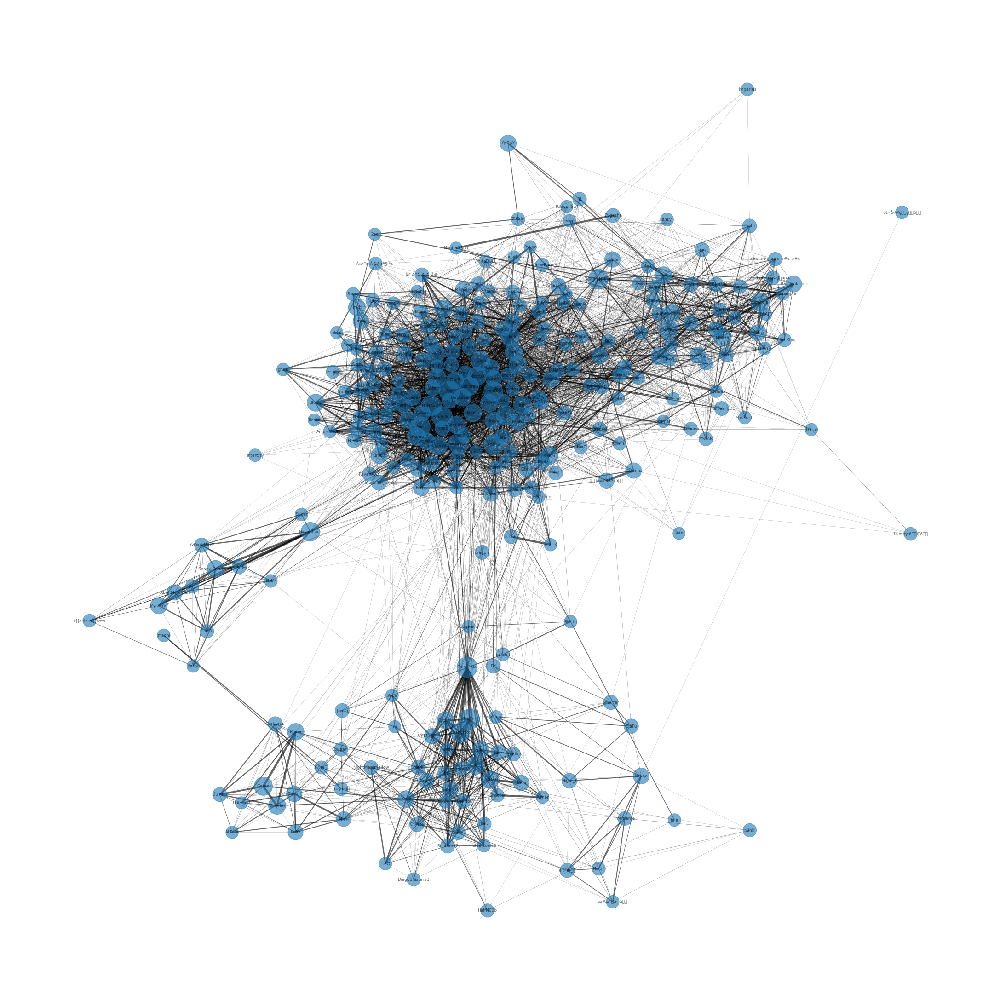

In [153]:
plt.figure(figsize = (30, 30))
nx.draw(g, pos=nx.drawing.layout.spring_layout(g, k=k_custom, weight='weight'),
        node_size=n_size, labels=n_labels, font_size=9, alpha=0.6,
        width=edge_w, with_labels=True)
plt.savefig('output_plots/g_small.png')

График распределения степеней вершин

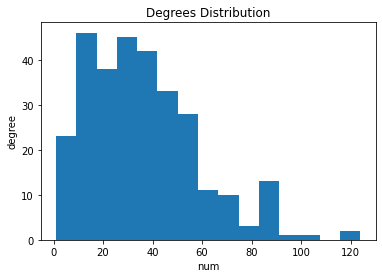

In [154]:
deg = [x[1] for x in list(nx.degree(g))]

plt.title("Degrees Distribution")
plt.xlabel('num')
plt.ylabel('degree')
plt.hist(deg, bins=15)
plt.savefig('output_plots/deg.png')

In [186]:
# Степень посредничества, мосты
# Кратчайшие пути между узлами
betw_centrality = nx.betweenness_centrality(g)
sorted_betw = sorted(betw_centrality.items(), key=lambda x: x[1], reverse=True)[:20]
for i, (num, betw_c) in enumerate(sorted_betw):
    print(i+1, n_labels[num], round(betw_c, 4))

1 brainless tee 0.1397
2 Kicker 0.0493
3 Night_L 0.0433
4 fikmesÃ¥n 0.0377
5 Colo-Colo 0.0362
6 Cendren 0.035
7 nameless tee 0.0299
8 Cireme 0.02
9 triki 0.0195
10 jao 0.0173
11 ÐÐ°Ð¼Ð±Ð¾ 0.0166
12 Noctua 0.0161
13 dragon 0.0154
14 Eki 0.015
15 SiuFu 0.0145
16 Freezestyler 0.0144
17 BaconDrink 0.014
18 ano :3 0.0139
19 bano 0.0136
20 'faceless 0.0125


In [187]:
# Степень близости — это мера центральности в сети,
# вычисляемая как обратная величина суммы длин кратчайших путей между узлом и
# всеми другими узлами графа. Таким образом, чем более централен узел,
# тем ближе он ко всем другим узлам.

clos_centrality = nx.closeness_centrality(g)
sorted_clos = sorted(clos_centrality.items(), key=lambda x: x[1], reverse=True)[:20]
for i, (num, clos_c) in enumerate(sorted_clos):
    print(i+1, n_labels[num], round(clos_c, 4))

1 Cendren 0.5924
2 brainless tee 0.5807
3 fikmesÃ¥n 0.5739
4 bano 0.563
5 triki 0.5587
6 Cireme 0.5535
7 <BÂµmM> 0.5535
8 Noctua 0.5535
9 nameless tee 0.5493
10 iParano 0.5493
11 Aoe 0.5453
12 Freezestyler 0.5453
13 Chairn 0.5423
14 Kicker 0.5413
15 BaconDrink 0.5413
16 HaHAxD* 0.5383
17 Konsti 0.5373
18 lola 0.5335
19 ZimE 0.5315
20 ano :3 0.5277


In [188]:
# Гармоническая центральность

all_nodes = set(g.nodes())
harmonic_cent = []

for x in all_nodes:
    h_cent = 0
    for y in (all_nodes - {x}):
        h_cent += 1 / nx.shortest_path_length(g, source=x, target=y)
    harmonic_cent.append((x, h_cent))

sorted_harm = sorted(harmonic_cent, key=lambda x: x[1], reverse=True)[:20]
for i, (num, harm_c) in enumerate(sorted_harm):
    print(i+1, n_labels[num], round(harm_c, 4))

1 Cendren 204.95
2 Noctua 197.05
3 bano 192.5
4 fikmesÃ¥n 191.8333
5 brainless tee 190.1667
6 triki 188.1667
7 <BÂµmM> 186.6667
8 Freezestyler 186.05
9 BaconDrink 185.7833
10 Cireme 185.0
11 Aoe 184.6667
12 HaHAxD* 184.55
13 Kicker 184.3833
14 iParano 184.3333
15 Chairn 183.1667
16 KlexMikrowelle 182.2167
17 Konsti 182.1167
18 nameless tee 180.3333
19 CÃ¸ke 179.8
20 'faceless 178.8833


In [189]:
harm_centrality = nx.harmonic_centrality(g)
sorted_cent = sorted(harm_centrality.items(), key=lambda x: x[1], reverse=True)
for i, (num, harm_c) in enumerate(sorted_cent):
    if i == 20:
        break
    print(i+1, n_labels[num], round(harm_c, 4))

1 Cendren 204.95
2 Noctua 197.05
3 bano 192.5
4 fikmesÃ¥n 191.8333
5 brainless tee 190.1667
6 triki 188.1667
7 <BÂµmM> 186.6667
8 Freezestyler 186.05
9 BaconDrink 185.7833
10 Cireme 185.0
11 Aoe 184.6667
12 HaHAxD* 184.55
13 Kicker 184.3833
14 iParano 184.3333
15 Chairn 183.1667
16 KlexMikrowelle 182.2167
17 Konsti 182.1167
18 nameless tee 180.3333
19 CÃ¸ke 179.8
20 'faceless 178.8833


In [192]:
sorted_betw = [x[0] for x in sorted_betw]
sorted_clos = [x[0] for x in sorted_clos]
sorted_harm = [x[0] for x in sorted_harm]
print(sorted_harm)

[160, 181, 74, 159, 79, 78, 32, 44, 267, 23, 6, 103, 161, 50, 3, 172, 100, 46, 8, 209]


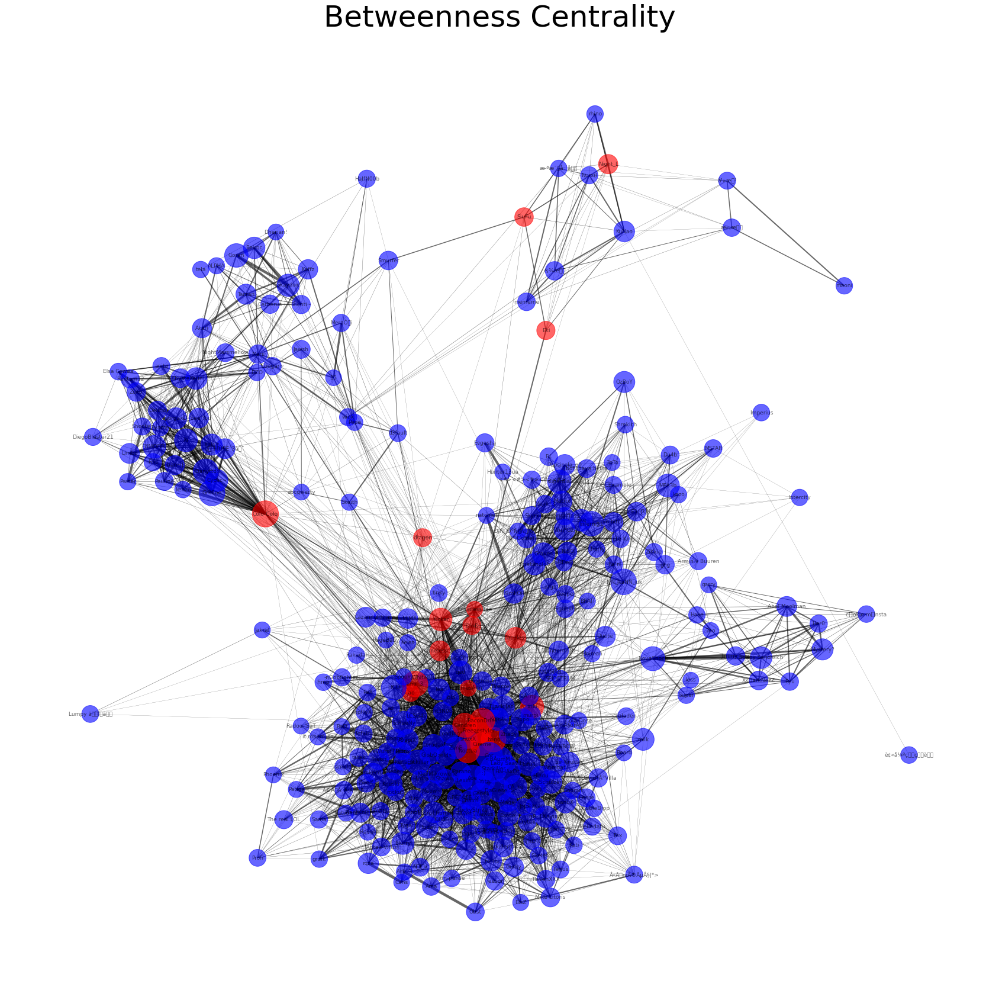

In [196]:
color_map = ['red' if node in sorted_betw else 'blue' for node in all_nodes]

plt.figure(figsize = (30, 30))
plt.title('Betweenness Centrality', fontdict = {'fontsize' : 50})
nx.draw(g, pos=nx.drawing.layout.spring_layout(g, k=k_custom, weight='weight'),
        node_size=n_size, node_color=color_map, labels=n_labels, font_size=9, alpha=0.6,
        width=edge_w, with_labels=True)
plt.savefig('output_plots/g_small_colored_betw.png')


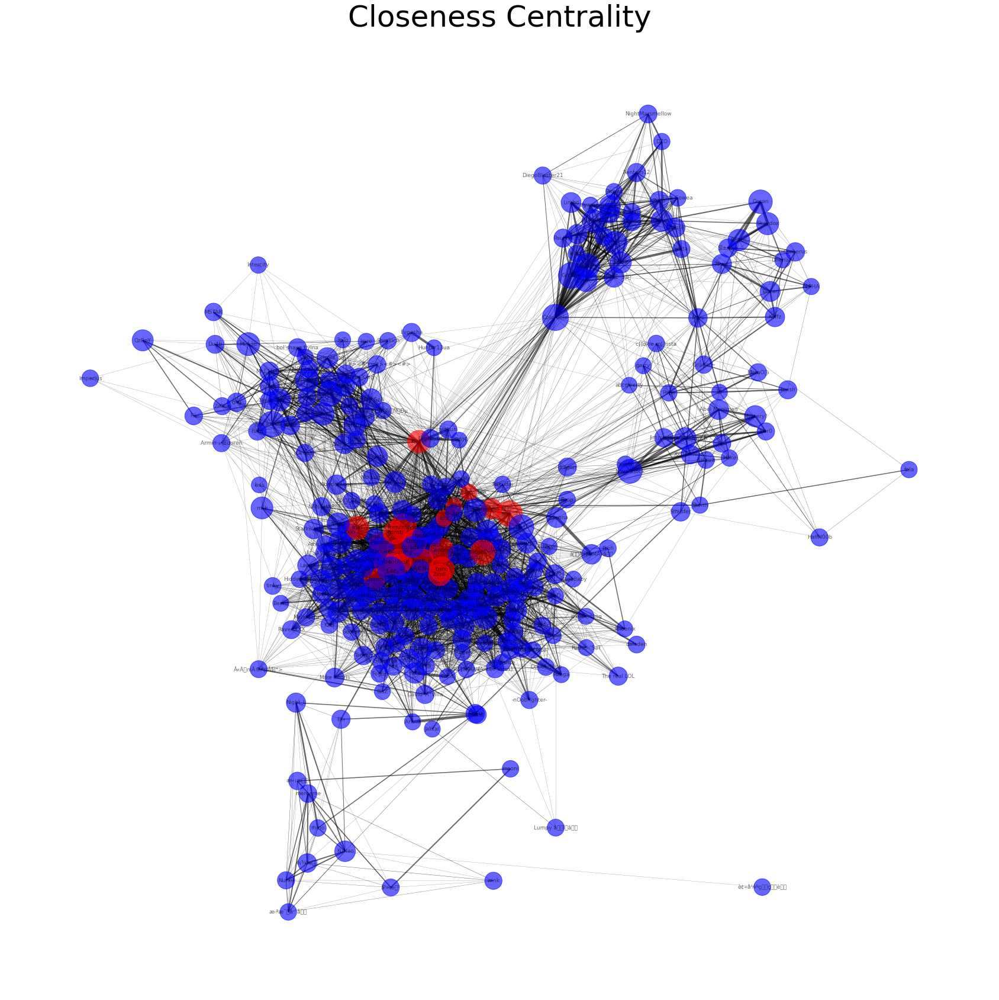

In [197]:
color_map = ['red' if node in sorted_clos else 'blue' for node in all_nodes]

plt.figure(figsize = (30, 30))
plt.title('Closeness Centrality', fontdict = {'fontsize' : 50})
nx.draw(g, pos=nx.drawing.layout.spring_layout(g, k=k_custom, weight='weight'),
        node_size=n_size, node_color=color_map, labels=n_labels, font_size=9, alpha=0.6,
        width=edge_w, with_labels=True)
plt.savefig('output_plots/g_small_colored_clos.png')

D:\PycharmProjects\DDNet_Social_graph\venv\lib\site-packages\matplotlib\backends\backend_agg.py:240: RuntimeWarning: Glyph 158 missing from current font.
  font.set_text(s, 0.0, flags=flags)
D:\PycharmProjects\DDNet_Social_graph\venv\lib\site-packages\matplotlib\backends\backend_agg.py:203: RuntimeWarning: Glyph 158 missing from current font.
  font.set_text(s, 0, flags=flags)
D:\PycharmProjects\DDNet_Social_graph\venv\lib\site-packages\matplotlib\backends\backend_agg.py:240: RuntimeWarning: Glyph 136 missing from current font.
  font.set_text(s, 0.0, flags=flags)
D:\PycharmProjects\DDNet_Social_graph\venv\lib\site-packages\matplotlib\backends\backend_agg.py:203: RuntimeWarning: Glyph 136 missing from current font.
  font.set_text(s, 0, flags=flags)
D:\PycharmProjects\DDNet_Social_graph\venv\lib\site-packages\matplotlib\backends\backend_agg.py:240: RuntimeWarning: Glyph 150 missing from current font.
  font.set_text(s, 0.0, flags=flags)
D:\PycharmProjects\DDNet_Social_graph\venv\lib\si

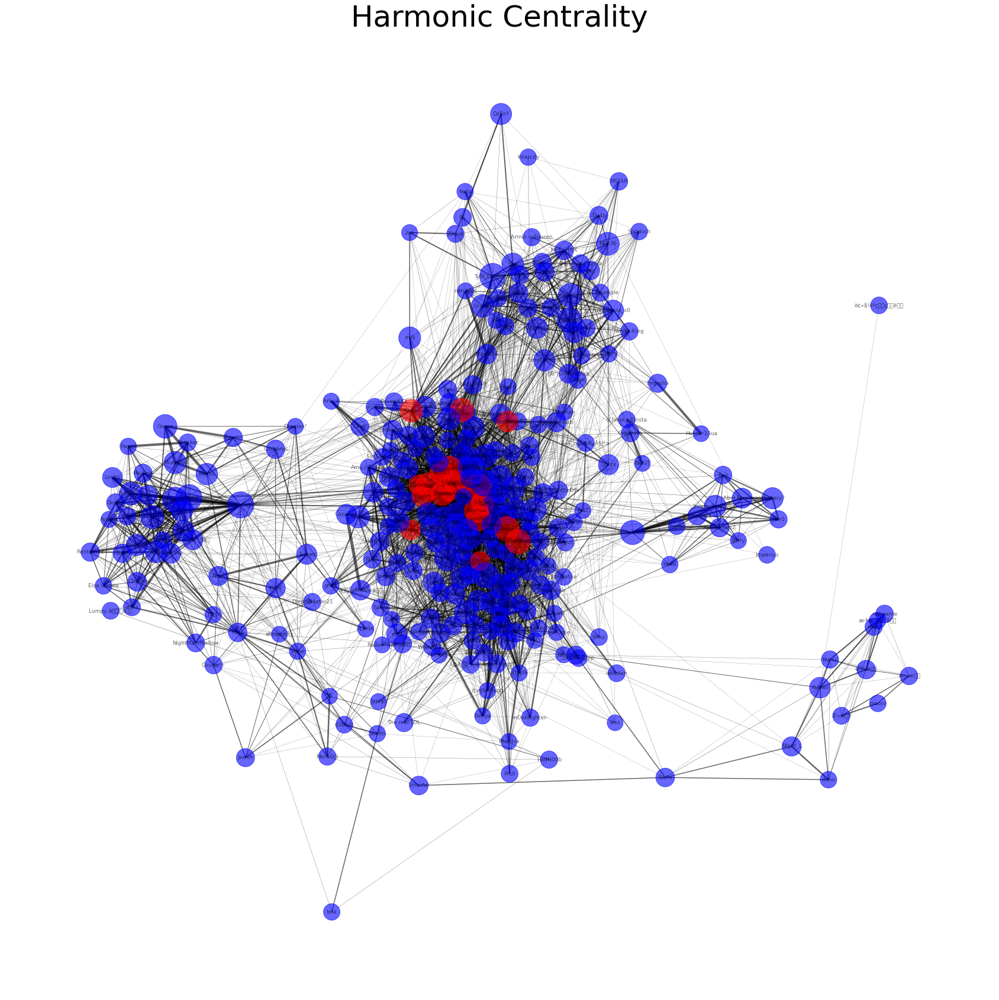

In [198]:
color_map = ['red' if node in sorted_harm else 'blue' for node in all_nodes]

plt.figure(figsize = (30, 30))
plt.title('Harmonic Centrality', fontdict = {'fontsize' : 50})
nx.draw(g, pos=nx.drawing.layout.spring_layout(g, k=k_custom, weight='weight'),
        node_size=n_size, node_color=color_map, labels=n_labels, font_size=9, alpha=0.6,
        width=edge_w, with_labels=True)
plt.savefig('output_plots/g_small_colored_harm.png')